# Import Python Library

In [1]:
import os
import shutil
import  joblib
import numpy as np
import pandas as pd
import librosa as lb
import librosa.display
import matplotlib.pyplot as plt
import random
import multiprocessing


from pathlib import Path
from tqdm.autonotebook import tqdm
import IPython.display
import soundfile as sf

import noisereduce as nr
from matplotlib import pyplot as plt
from scipy.ndimage import maximum_filter1d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  


In [2]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
#     torch.manual_seed(seed)
#     torch.cuda.manual_seed(seed)  # type: ignore
set_seed(777)

# Data

In [3]:
DATA_DIR = Path("/home/knikaido/work/BirdCLEF2021/data/")
MAIN_DATA_DIR = DATA_DIR / 'birdclef-2021'
OUTPUT_DIR = DATA_DIR / 'birdclef-2021-denoise/train_short_audio'

In [4]:
######################
# Data #
######################
train_datadir = MAIN_DATA_DIR / 'train_short_audio'
train_csv = MAIN_DATA_DIR / 'train_metadata.csv'
train_soundscape = MAIN_DATA_DIR / 'train_soundscape_labels.csv'

output_train_datadir = OUTPUT_DIR / 'train_short_audio'

In [5]:
df_train = pd.read_csv(MAIN_DATA_DIR / 'train_metadata.csv')
df_train

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605
1,acafly,[],['call'],9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209
2,acafly,[],['call'],5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032
3,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974
4,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,yetvir,[],"['adult', 'male', 'song']",30.2150,-97.6505,Vireo flavifrons,Yellow-throated Vireo,Caleb Helsel,2020-07-10,XC591680.ogg,Creative Commons Attribution-NonCommercial-Sha...,1.0,08:30,https://www.xeno-canto.org/591680
62870,yetvir,[],"['life stage uncertain', 'sex uncertain', 'song']",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2019-05-31,XC600085.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,09:30,https://www.xeno-canto.org/600085
62871,yetvir,"['amered', 'eawpew', 'norcar', 'reevir1']","['adult', 'male', 'song']",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2020-06-02,XC602701.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.5,08:30,https://www.xeno-canto.org/602701
62872,yetvir,[],['uncertain'],32.2357,-99.8811,Vireo flavifrons,Yellow-throated Vireo,Brad Banner,2019-04-27,XC614733.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.0,17:30,https://www.xeno-canto.org/614733


# Tools

In [6]:
class params:
    """
    Parameters used for the audio data
    """
    sr = 32000

    # Melspectrogram
    n_mels = 128
    fmin = 20
    fmax = sr // 2  # Shannon theorem

In [7]:
def load_audio(record, sr=32000, root=""):
    y, sr = sf.read(record)
#     y, _ = lb.load(
#         root.joinpath(record).with_suffix(".flac").as_posix(),
#         sr=sr, 
#     )
    return y

In [8]:
def compute_melspec(y, params):
    """
    Computes a mel-spectrogram and puts it at decibel scale
    Arguments:
        y {np array} -- signal
        params {AudioParams} -- Parameters to use for the spectrogram. Expected to have the attributes sr, n_mels, f_min, f_max
    Returns:
        np array -- Mel-spectrogram
    """
    melspec = lb.feature.melspectrogram(
        y, sr=params.sr, n_mels=params.n_mels, fmin=params.fmin, fmax=params.fmax,
    )

    melspec = lb.power_to_db(melspec).astype(np.float32)
    return melspec

# Example

original sound

In [9]:
idx = 0
raw = df_train.iloc[idx]

wav_name = raw["filename"]
ebird_code = raw["primary_label"]

In [10]:
y = load_audio(train_datadir / ebird_code / wav_name, params.sr)
IPython.display.Audio(y, rate=params.sr)

## Denoise

I detect point no birdcall by using Sound Envelope.

In [11]:
def envelope(y, rate, threshold):
    mask = []
    y_mean = maximum_filter1d(np.abs(y), mode="constant", size=rate//20)
    for mean in y_mean:
        if mean > threshold:
            mask.append(True)
        else:
            mask.append(False)
    return mask, y_mean

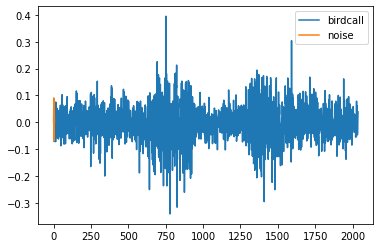

In [12]:
thr = 0.1
mask, env = envelope(y, params.sr, thr)

plt.plot(y[::1000], label="birdcall")
plt.plot(y[np.logical_not(mask)][::1000], label="noise")
plt.legend(bbox_to_anchor=(1, 1), loc='upper right')

denoise and check denoise sound

  0%|          | 0/7 [00:00<?, ?it/s]

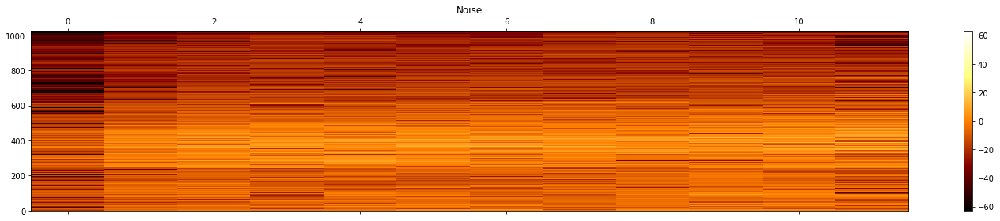

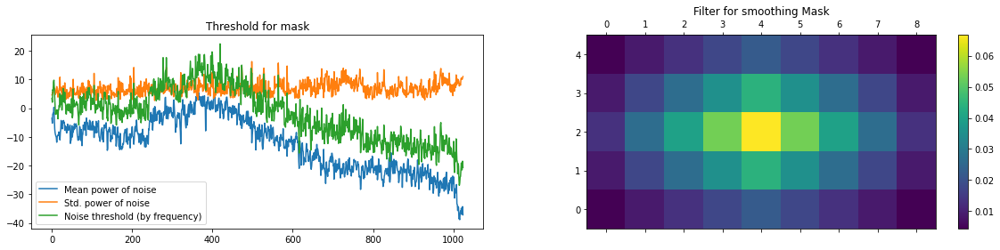

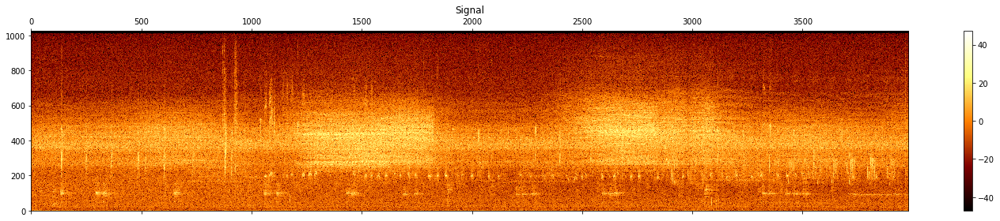

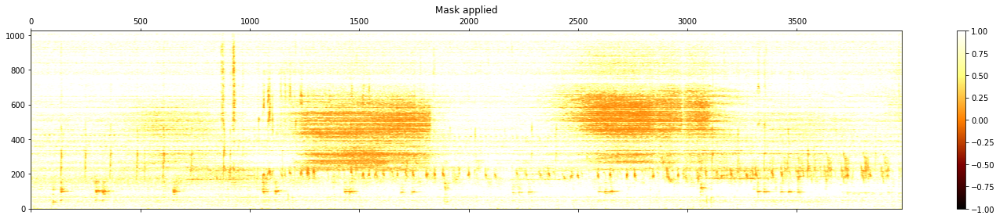

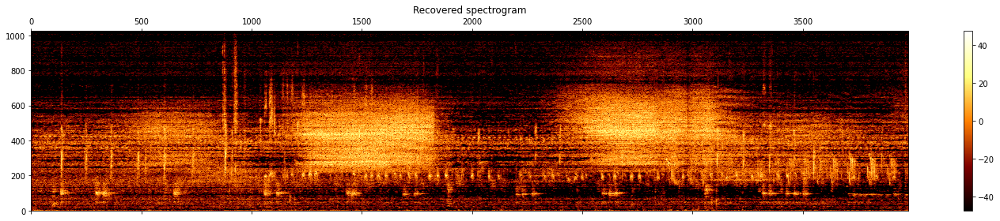

In [13]:
y_denoise = nr.reduce_noise(audio_clip=y, noise_clip=y[np.logical_not(mask)], verbose=True)

compare original sound spectrum and denoise sound spectrum.

In [14]:
IPython.display.Audio(y_denoise, rate=params.sr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':


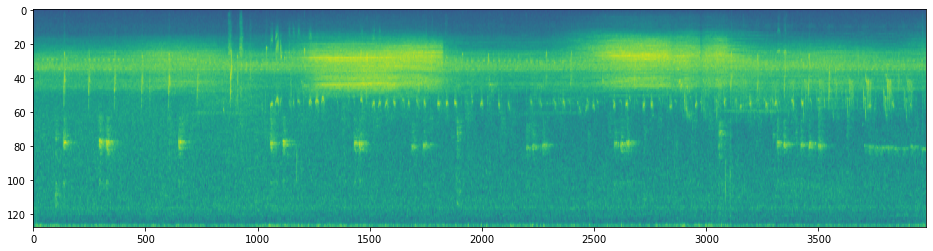

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


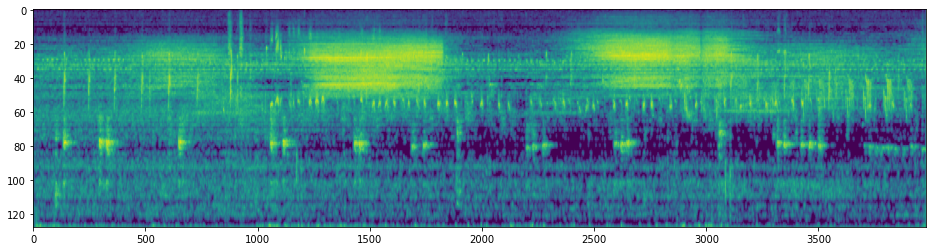

In [15]:
def tmp_audio_to_spec(audio, sr):
    spec = librosa.power_to_db(
        librosa.feature.melspectrogram(audio, sr=sr, fmin=20, fmax=16000, n_mels=128)
    )
    return np.flipud(spec.astype(np.float32))

plt.figure(figsize=(16, 4))
plt.imshow(tmp_audio_to_spec(y, params.sr))
plt.axes().set_aspect('auto')
plt.show()

plt.figure(figsize=(16, 4))
plt.imshow(tmp_audio_to_spec(y_denoise, params.sr))
plt.axes().set_aspect('auto')
plt.show()

In [16]:
y_harm, y_perc = librosa.effects.hpss(y, margin=(1.0,5.0))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until


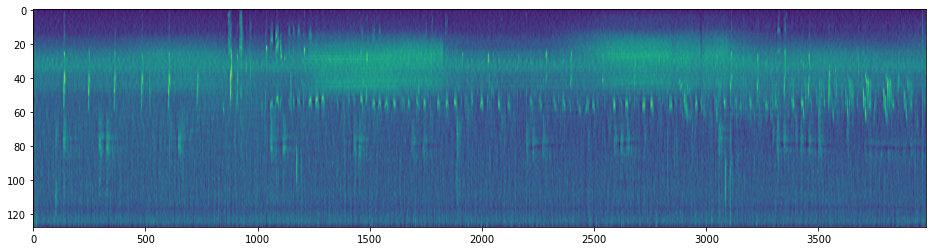

In [17]:
plt.figure(figsize=(16, 4))
plt.imshow(tmp_audio_to_spec(y_perc, params.sr))
plt.axes().set_aspect('auto')
plt.show()

In [18]:
IPython.display.Audio(y_perc, rate=params.sr)

# Main

## Train

In [19]:
def load_and_save_train(record):
    wav_name = record["filename"]
    ebird_code = record["primary_label"]
    
    y = load_audio(train_datadir / ebird_code / wav_name, params.sr)
    # denoise
    mask, env = envelope(y, 32000, thr)
    noise_clip = y[np.logical_not(mask)]
    if len(noise_clip):
        y = nr.reduce_noise(audio_clip=y, noise_clip=noise_clip, verbose=False)
        
    dir_ = OUTPUT_DIR / ebird_code
#     wav_name = wav_name.split('.')[0]
    if not os.path.isdir(dir_):
        os.makedirs(dir_)

    sf.write(dir_ / wav_name, y, params.sr)
    
#     np.save(OUT_TRAIN + record + ".npy", melspec)

In [ ]:
processes = multiprocessing.cpu_count()

with multiprocessing.Pool(processes=processes) as pool:
    tmp = pool.imap_unordered(load_and_save_train, df_train.iloc)
    result = list(tqdm(tmp))

0it [00:00, ?it/s]

/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=460
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=387
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=456
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=717
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=355
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1975
  n_fft, y.shape[-1]
/usr/local/lib/python3.6/dist-packages/librosa/core

In [ ]:
shutil.make_archive(OUT_TRAIN, 'zip', OUT_TRAIN)
shutil.rmtree(OUT_TRAIN)

## Test

In [33]:
def load_and_save_test(record):
    y = load_audio(record, params.sr, TEST_AUDIO_ROOT)
    melspec = compute_melspec(y, params)

    np.save(OUT_TEST + record + ".npy", melspec)
    
    
def load_and_save_test(record):
    y = load_audio(record, params.sr, TEST_AUDIO_ROOT)
    # denoise
    mask, env = envelope(y, 32000, thr)
    noise_clip = y[np.logical_not(mask)]
    if len(noise_clip):
        y = nr.reduce_noise(audio_clip=y, noise_clip=noise_clip, verbose=False)
#     melspec = compute_melspec(y, params)
    sf.write(OUT_TEST + '/' +  record+'_denoise.flac', y, params.sr)

In [34]:
OUT_TEST = str(RAW_DATA / 'test_denoise')
OUT_TEST_PATH = RAW_DATA / 'test_denoise'
# OUT_TEST = 'test/'
# os.mkdir(OUT_TEST)

In [35]:
_ = joblib.Parallel(n_jobs=8)(
    joblib.delayed(load_and_save_test)(record) for record in tqdm(df_test['recording_id'].values)
)



  0%|          | 0/1992 [00:00<?, ?it/s]

  1%|          | 16/1992 [00:06<13:40,  2.41it/s]

  1%|          | 24/1992 [00:09<13:38,  2.40it/s]

  2%|▏         | 32/1992 [00:14<15:01,  2.17it/s]

  2%|▏         | 40/1992 [00:18<15:57,  2.04it/s]

  2%|▏         | 48/1992 [00:23<16:30,  1.96it/s]

  3%|▎         | 56/1992 [00:27<16:56,  1.90it/s]

  3%|▎         | 64/1992 [00:32<17:09,  1.87it/s]

  4%|▎         | 72/1992 [00:37<17:50,  1.79it/s]

  4%|▍         | 80/1992 [00:42<18:35,  1.71it/s]

  4%|▍         | 88/1992 [00:47<19:03,  1.67it/s]

  5%|▍         | 96/1992 [00:53<19:54,  1.59it/s]

  5%|▌         | 104/1992 [00:58<19:57,  1.58it/s]

  6%|▌         | 112/1992 [01:03<19:53,  1.58it/s]

  6%|▌         | 120/1992 [01:08<19:56,  1.56it/s]

  6%|▋         | 128/1992 [01:13<19:45,  1.57it/s]

  7%|▋         | 136/1992 [01:18<19:35,  1.58it/s]

  7%|▋         | 144/1992 [01:24<19:57,  1.54it/s]

  8%|▊         | 152/1992 [01:29<19:49,  1.55it/s]

  8%|▊         | 160/1992 [01:3

In [ ]:
a

In [ ]:
1

In [ ]:
shutil.make_archive(OUT_TEST, 'zip', OUT_TEST)
shutil.rmtree(OUT_TEST)